# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [3]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [4]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [5]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [6]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [7]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [8]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [9]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [10]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [11]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim ,1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [12]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [13]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [14]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [15]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    z = torch.randn(num_images, z_dim, device=device)
    gen_images = gen(z)
    gen_images = gen_images.detach()
    
    fake_pred = disc(gen_images)
    fake_gt = torch.zeros_like(fake_pred)
    fake_loss = criterion(fake_pred, fake_gt)
    
    real_pred = disc(real)
    real_gt = torch.ones_like(real_pred)
    real_loss = criterion(real_pred, real_gt)
    
    disc_loss = (fake_loss + real_loss) / 2

    #### END CODE HERE ####
    return disc_loss

In [17]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [18]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    z = get_noise(num_images, z_dim, device=device)
    gen_images = gen(z)
    fake_pred = disc(gen_images)
    gen_gt = torch.ones_like(fake_pred)
    gen_loss = criterion(fake_pred, gen_gt)
    #### END CODE HERE ####
    return gen_loss

In [19]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Epoch 1, step 500: Generator loss: 1.3953286110162737, discriminator loss: 0.41806484752893414


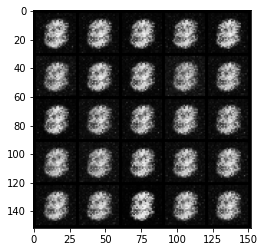

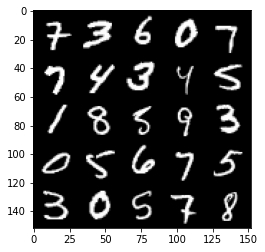

Epoch 2, step 1000: Generator loss: 1.755127584218978, discriminator loss: 0.2788892858624458


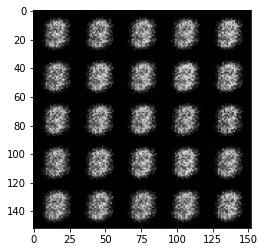

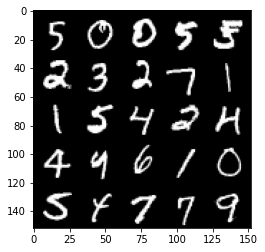

Epoch 3, step 1500: Generator loss: 2.0578311297893523, discriminator loss: 0.15837368240952482


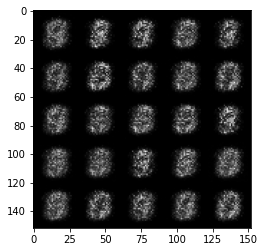

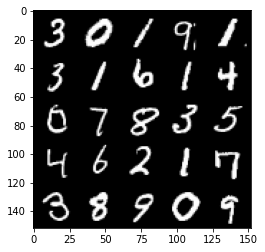

Epoch 4, step 2000: Generator loss: 1.6746710112094894, discriminator loss: 0.22545582926273333


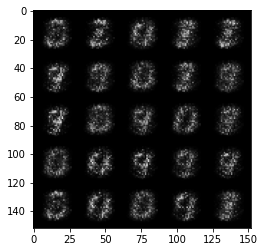

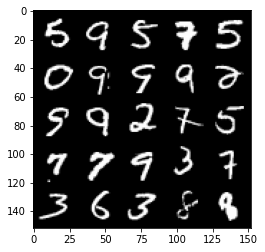

Epoch 5, step 2500: Generator loss: 1.6617149949073804, discriminator loss: 0.20736543953418718


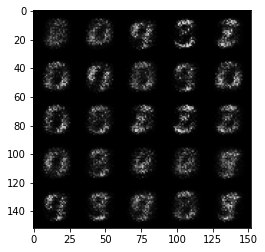

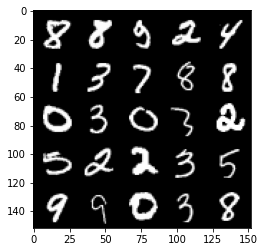

Epoch 6, step 3000: Generator loss: 1.916345902919771, discriminator loss: 0.1725758461207151


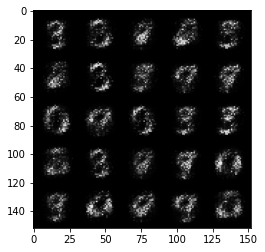

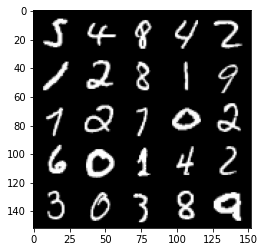

Epoch 7, step 3500: Generator loss: 2.313945257425308, discriminator loss: 0.1370231096595525


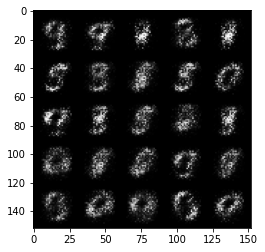

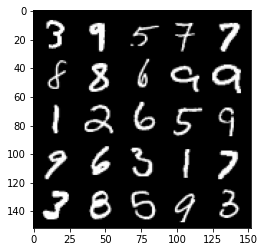

Epoch 8, step 4000: Generator loss: 2.710052566051483, discriminator loss: 0.11031234821677208


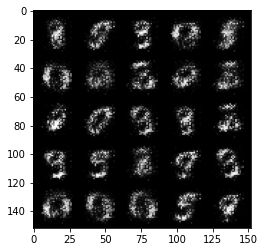

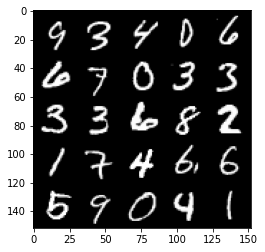

Epoch 9, step 4500: Generator loss: 3.2666008787155136, discriminator loss: 0.08252678284049036


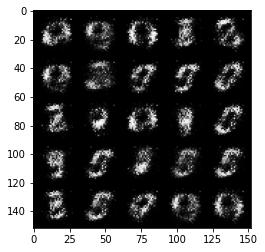

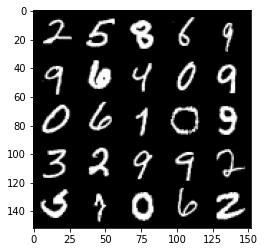

Epoch 10, step 5000: Generator loss: 3.4492125387191774, discriminator loss: 0.06913161405175927


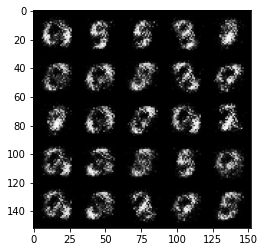

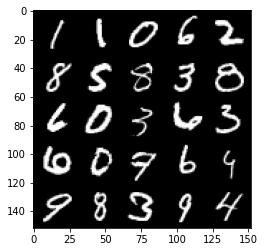

Epoch 11, step 5500: Generator loss: 3.8609064526557906, discriminator loss: 0.05559257015958432


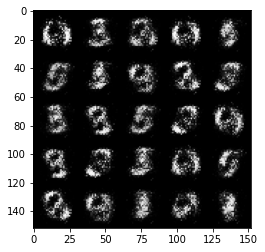

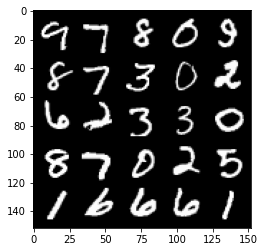

Epoch 12, step 6000: Generator loss: 4.019981996536253, discriminator loss: 0.05264076723903415


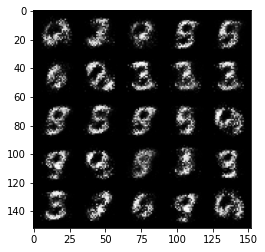

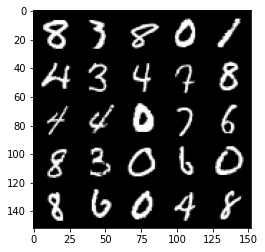

Epoch 13, step 6500: Generator loss: 4.002719729423526, discriminator loss: 0.04806360245496036


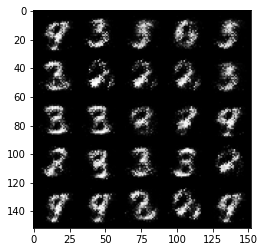

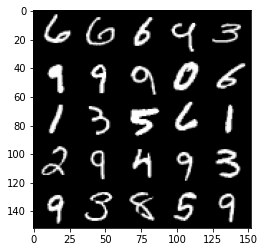

Epoch 14, step 7000: Generator loss: 4.247099656581878, discriminator loss: 0.04349069924280048


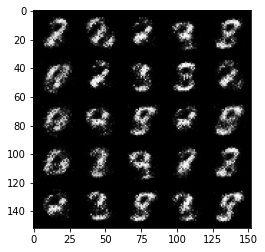

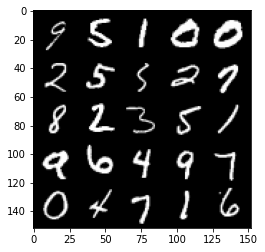

Epoch 15, step 7500: Generator loss: 4.4396684994697555, discriminator loss: 0.04270463532954462


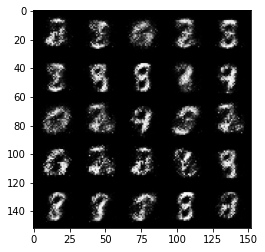

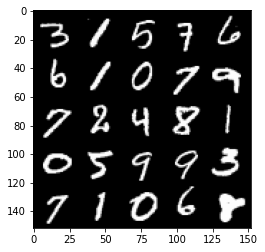

Epoch 17, step 8000: Generator loss: 4.240434350490565, discriminator loss: 0.05909517478942871


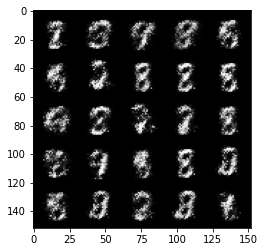

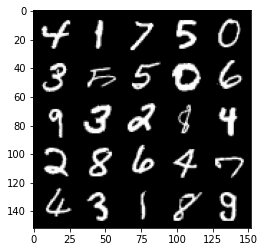

Epoch 18, step 8500: Generator loss: 4.294365176200868, discriminator loss: 0.05161062987148761


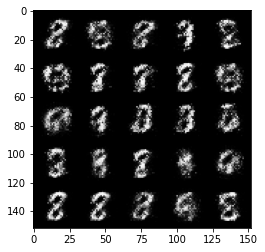

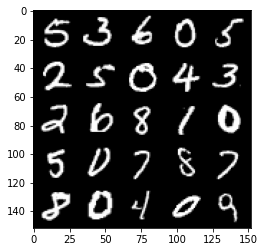

Epoch 19, step 9000: Generator loss: 4.453716670989993, discriminator loss: 0.0449351202845573


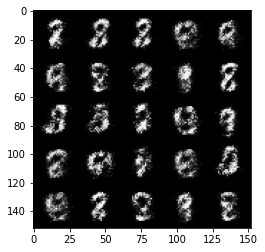

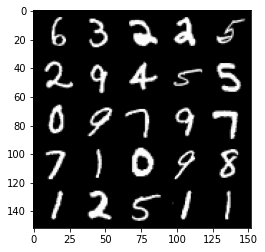

Epoch 20, step 9500: Generator loss: 4.33346083831787, discriminator loss: 0.05073339901864528


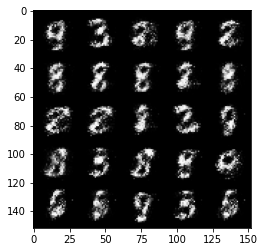

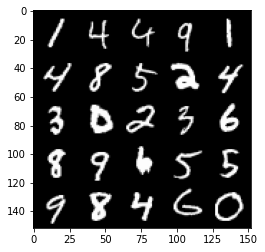

Epoch 21, step 10000: Generator loss: 4.38945937919617, discriminator loss: 0.047399850308895125


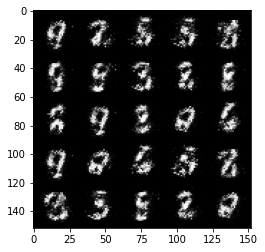

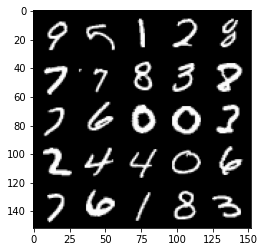

Epoch 22, step 10500: Generator loss: 4.343097343921664, discriminator loss: 0.0515682941041887


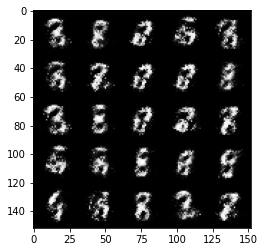

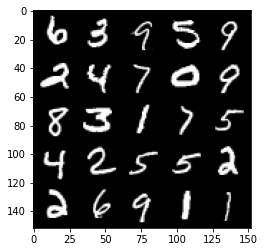

Epoch 23, step 11000: Generator loss: 4.019225510120394, discriminator loss: 0.06410314792767172


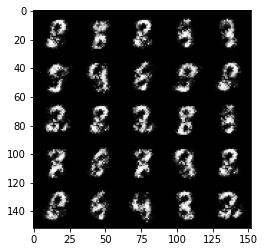

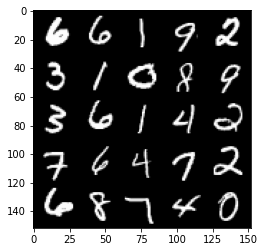

Epoch 24, step 11500: Generator loss: 3.993546892166139, discriminator loss: 0.07587720270454874


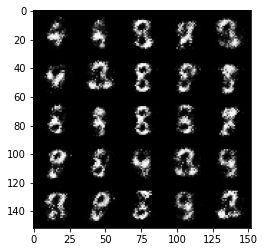

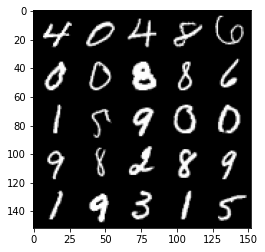

Epoch 25, step 12000: Generator loss: 3.954193409442899, discriminator loss: 0.0733172836154699


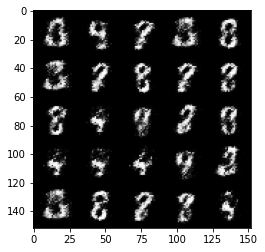

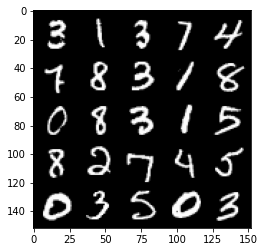

Epoch 26, step 12500: Generator loss: 3.896036671161653, discriminator loss: 0.085260389521718


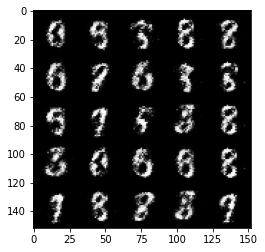

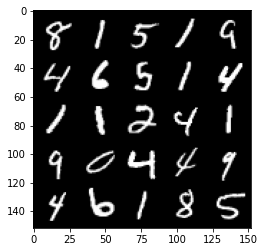

Epoch 27, step 13000: Generator loss: 3.991785790443422, discriminator loss: 0.08526954859495159


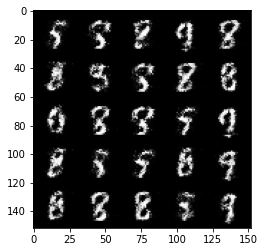

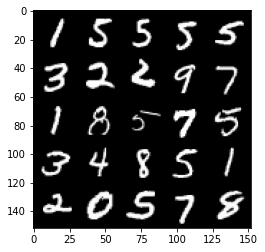

Epoch 28, step 13500: Generator loss: 3.971490723133086, discriminator loss: 0.09356465271115297


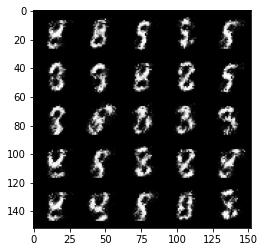

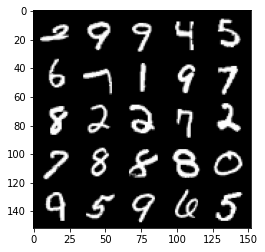

Epoch 29, step 14000: Generator loss: 3.804525095939639, discriminator loss: 0.09105650145560512


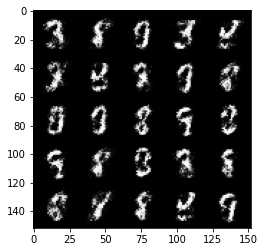

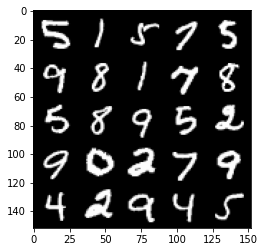

Epoch 30, step 14500: Generator loss: 3.7572938275337213, discriminator loss: 0.10236160311102868


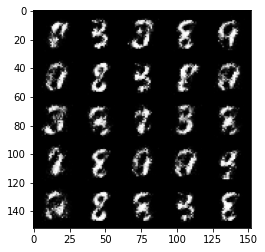

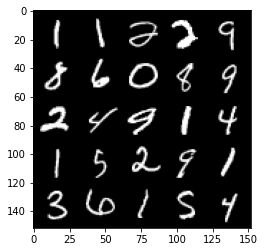

Epoch 31, step 15000: Generator loss: 3.643462349891664, discriminator loss: 0.11556777302175758


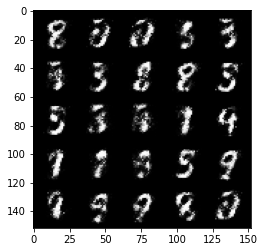

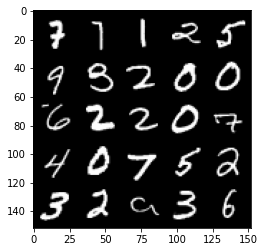

Epoch 33, step 15500: Generator loss: 3.6515524253845197, discriminator loss: 0.1015368756800889


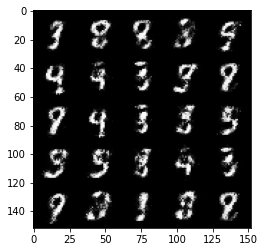

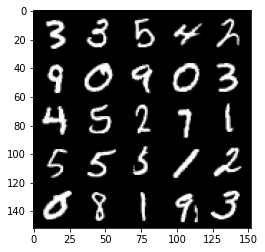

Epoch 34, step 16000: Generator loss: 3.586395936965945, discriminator loss: 0.10931736764311777


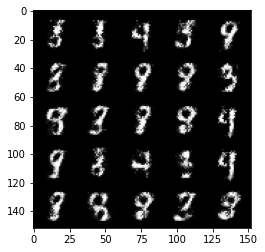

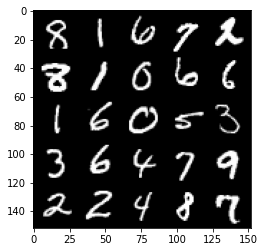

Epoch 35, step 16500: Generator loss: 3.371347713470458, discriminator loss: 0.1284923178553581


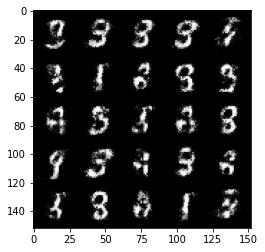

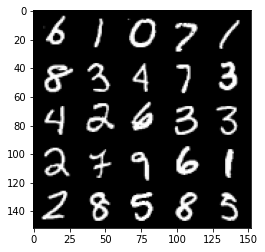

Epoch 36, step 17000: Generator loss: 3.44630374288559, discriminator loss: 0.12543262451887127


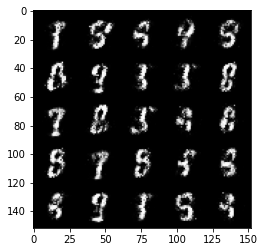

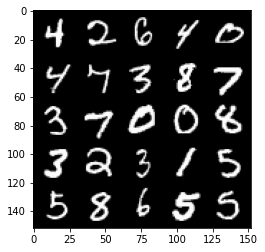

Epoch 37, step 17500: Generator loss: 3.3214317779541, discriminator loss: 0.13783504410088077


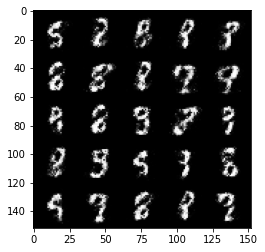

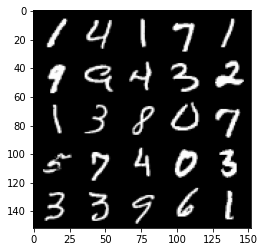

Epoch 38, step 18000: Generator loss: 3.358828388214114, discriminator loss: 0.13700709803402417


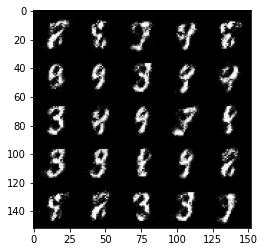

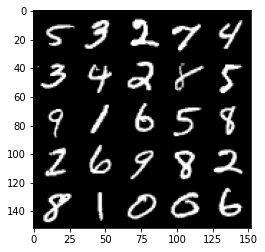

Epoch 39, step 18500: Generator loss: 3.351522561073307, discriminator loss: 0.13917845040559762


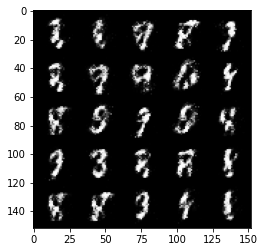

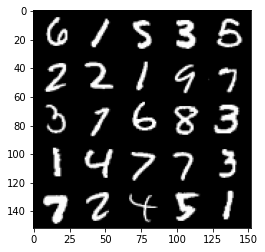

Epoch 40, step 19000: Generator loss: 3.2650593428611794, discriminator loss: 0.14416660337150103


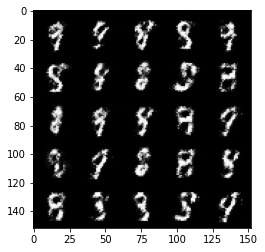

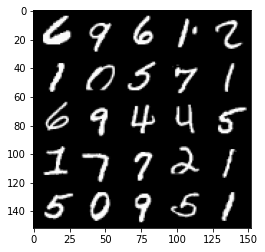

Epoch 41, step 19500: Generator loss: 3.1388557100296, discriminator loss: 0.14414552641659958


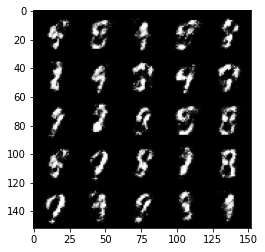

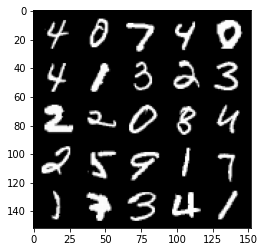

Epoch 42, step 20000: Generator loss: 3.139956372737881, discriminator loss: 0.15679277175664905


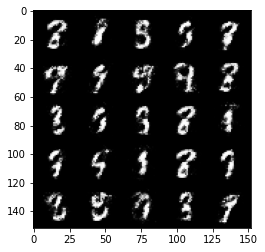

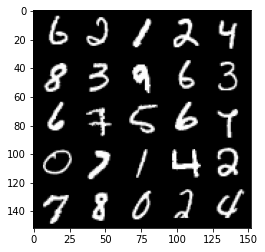

Epoch 43, step 20500: Generator loss: 2.915853269100188, discriminator loss: 0.1877128608524797


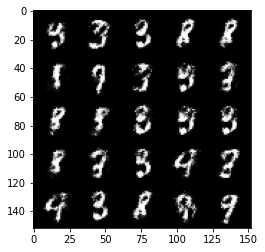

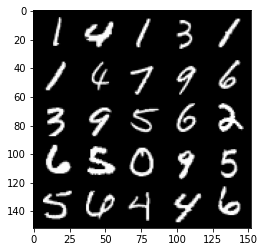

Epoch 44, step 21000: Generator loss: 2.9063408207893358, discriminator loss: 0.16839366249740118


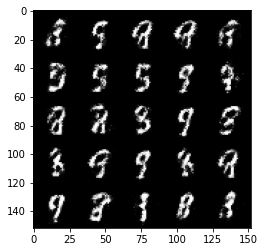

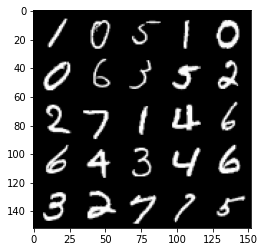

Epoch 45, step 21500: Generator loss: 3.017295926094052, discriminator loss: 0.1683941644132138


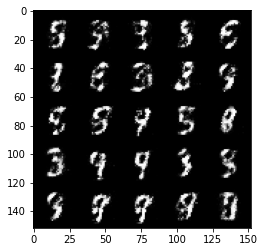

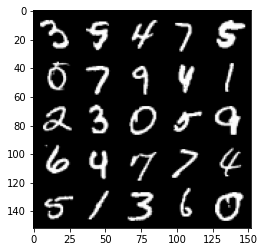

Epoch 46, step 22000: Generator loss: 2.9496638684272756, discriminator loss: 0.1752723620384931


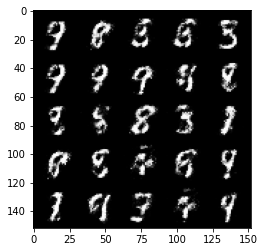

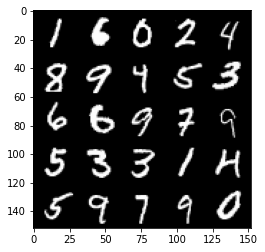

Epoch 47, step 22500: Generator loss: 2.907552080154419, discriminator loss: 0.18073000966012448


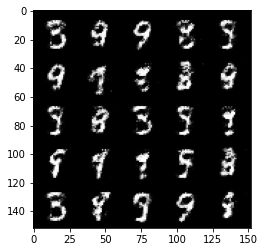

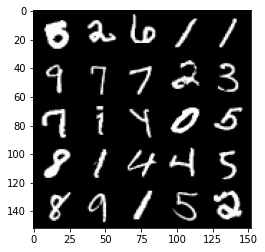

Epoch 49, step 23000: Generator loss: 3.0408458766937265, discriminator loss: 0.16277072235941892


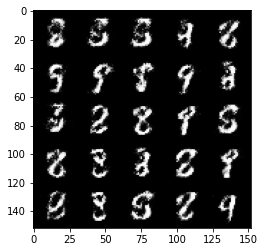

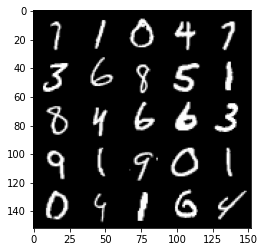

Epoch 50, step 23500: Generator loss: 2.8947079262733464, discriminator loss: 0.18546273575723166


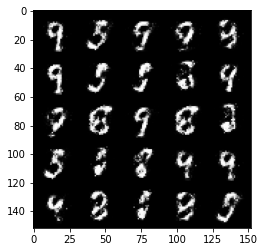

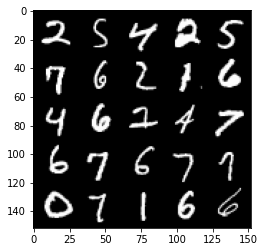

Epoch 51, step 24000: Generator loss: 2.82592375564575, discriminator loss: 0.1875954597443343


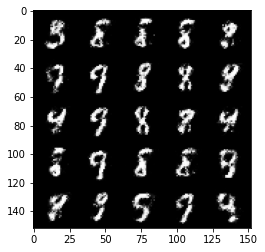

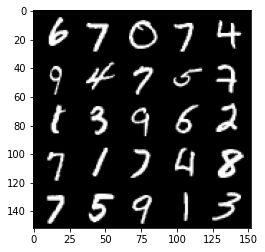

Epoch 52, step 24500: Generator loss: 2.750329116821292, discriminator loss: 0.19875060613453369


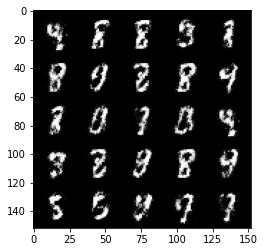

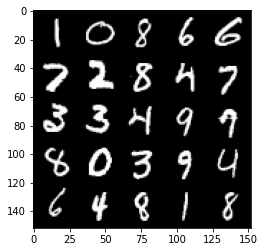

Epoch 53, step 25000: Generator loss: 2.7049390277862524, discriminator loss: 0.1999299553483726


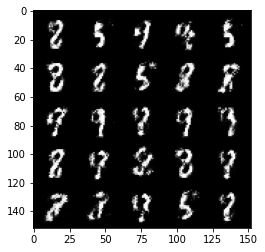

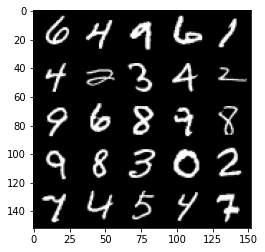

Epoch 54, step 25500: Generator loss: 2.7540747599601736, discriminator loss: 0.19482388815283766


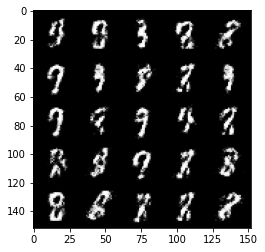

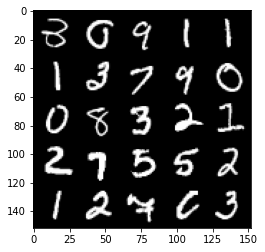

Epoch 55, step 26000: Generator loss: 2.82823179578781, discriminator loss: 0.17688531975448132


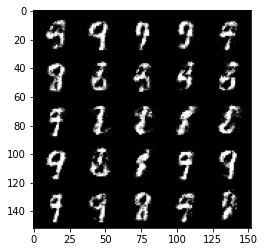

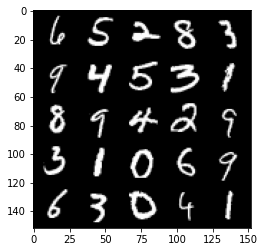

Epoch 56, step 26500: Generator loss: 2.706318707942963, discriminator loss: 0.20485570657253255


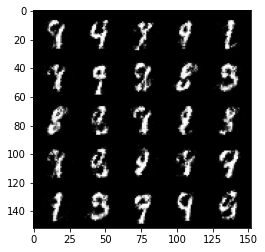

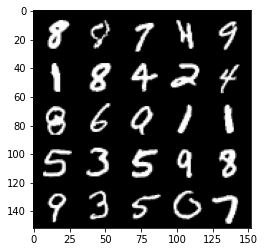

Epoch 57, step 27000: Generator loss: 2.6246160993576044, discriminator loss: 0.21702099348604675


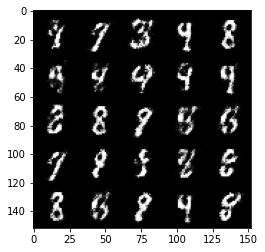

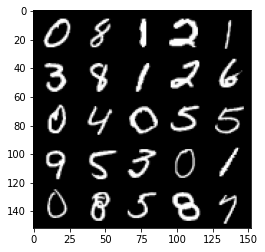

Epoch 58, step 27500: Generator loss: 2.66247224664688, discriminator loss: 0.21948602126538755


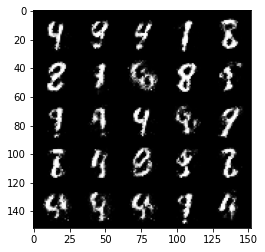

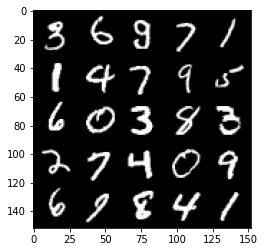

Epoch 59, step 28000: Generator loss: 2.539022228240967, discriminator loss: 0.22910842567682277


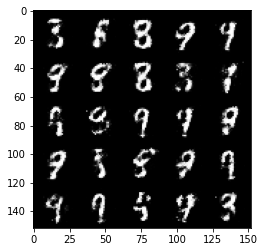

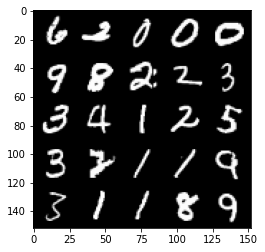

Epoch 60, step 28500: Generator loss: 2.5913450326919563, discriminator loss: 0.2109932751357555


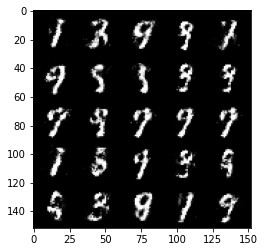

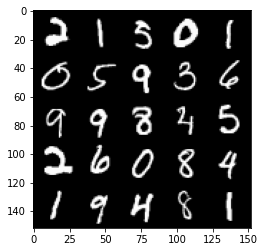

Epoch 61, step 29000: Generator loss: 2.619598579406742, discriminator loss: 0.2105672417879104


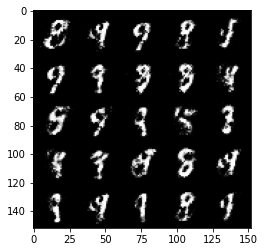

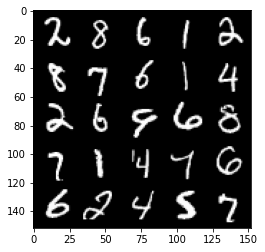

Epoch 62, step 29500: Generator loss: 2.5770250344276446, discriminator loss: 0.22544620081782327


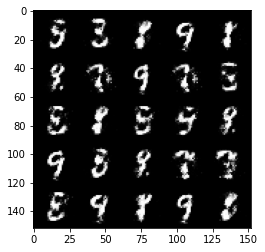

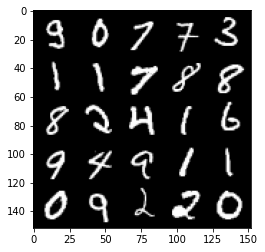

Epoch 63, step 30000: Generator loss: 2.541791091442108, discriminator loss: 0.22139281383156786


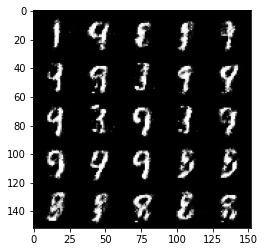

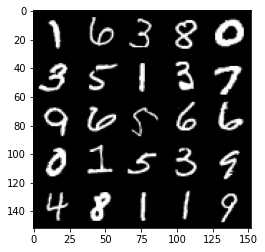

Epoch 65, step 30500: Generator loss: 2.514187701225279, discriminator loss: 0.22432729458808895


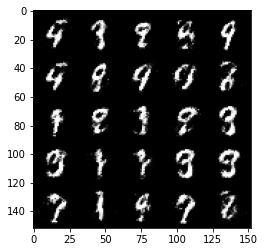

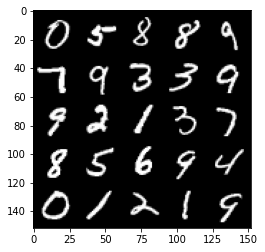

Epoch 66, step 31000: Generator loss: 2.5580338320732148, discriminator loss: 0.21541398513317087


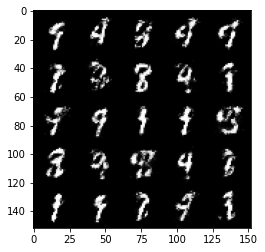

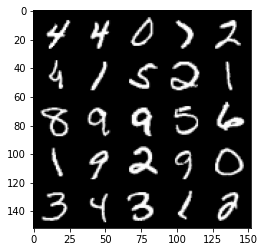

Epoch 67, step 31500: Generator loss: 2.479115102767944, discriminator loss: 0.23224933978915233


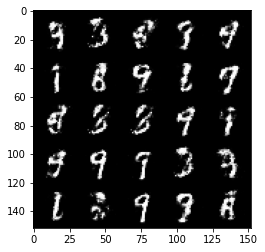

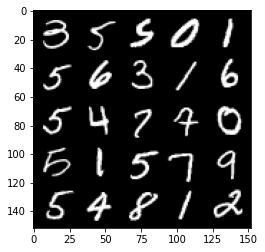

Epoch 68, step 32000: Generator loss: 2.4680812692642218, discriminator loss: 0.2286018129885195


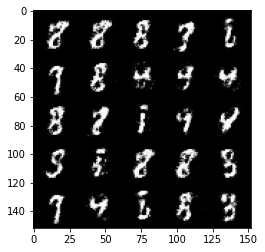

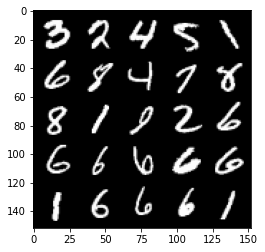

Epoch 69, step 32500: Generator loss: 2.490741672515869, discriminator loss: 0.2270642478615046


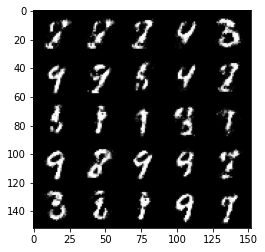

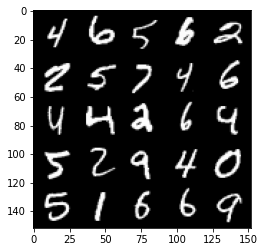

Epoch 70, step 33000: Generator loss: 2.370677628517153, discriminator loss: 0.24526145434379584


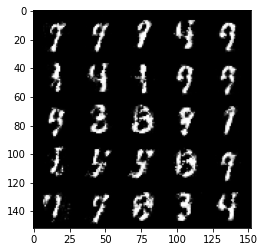

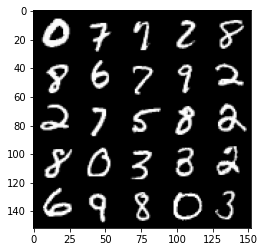

Epoch 71, step 33500: Generator loss: 2.2513419787883775, discriminator loss: 0.2629037236869336


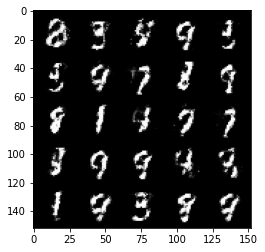

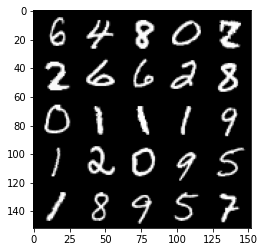

Epoch 72, step 34000: Generator loss: 2.393948633670806, discriminator loss: 0.22992821967601804


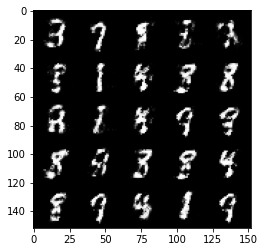

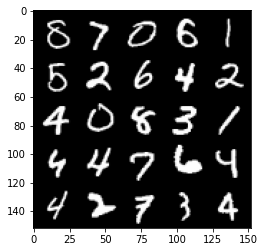

Epoch 73, step 34500: Generator loss: 2.4978743939399735, discriminator loss: 0.2200295722484589


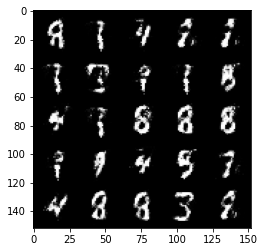

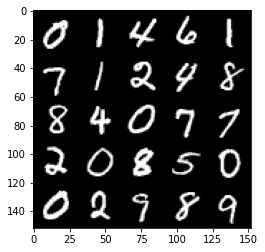

Epoch 74, step 35000: Generator loss: 2.2701723895072954, discriminator loss: 0.2611644850075245


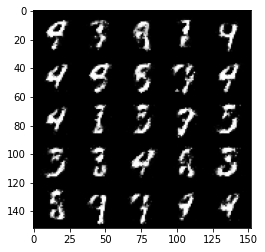

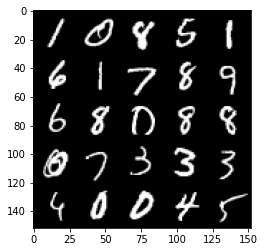

Epoch 75, step 35500: Generator loss: 2.369446574211123, discriminator loss: 0.24135545280575776


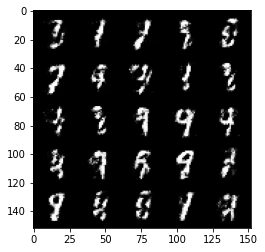

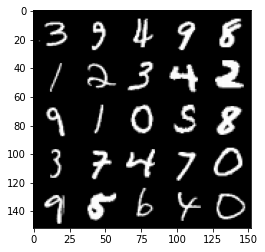

Epoch 76, step 36000: Generator loss: 2.394541644334793, discriminator loss: 0.24755866304039945


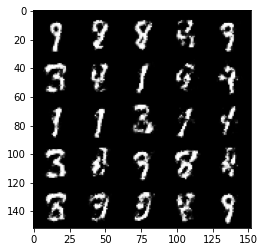

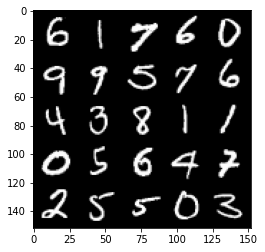

Epoch 77, step 36500: Generator loss: 2.3158506152629856, discriminator loss: 0.25822056552767747


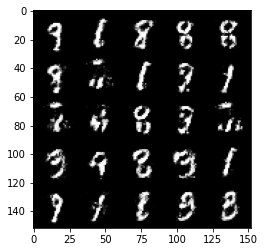

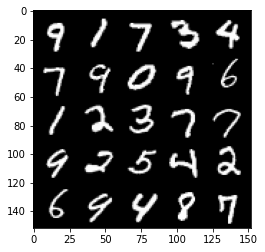

Epoch 78, step 37000: Generator loss: 2.280671988010407, discriminator loss: 0.2588112710714341


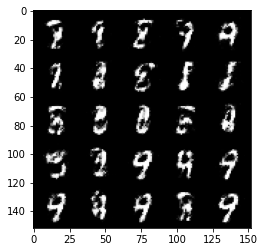

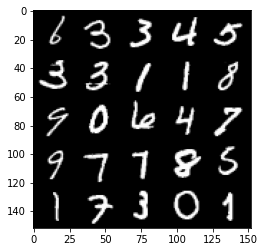

Epoch 79, step 37500: Generator loss: 2.4274481501579275, discriminator loss: 0.22409509888291362


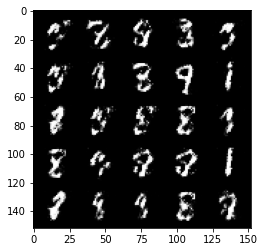

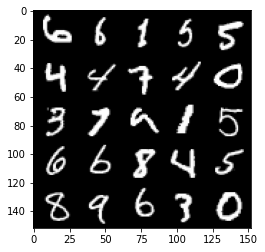

Epoch 81, step 38000: Generator loss: 2.2927828419208542, discriminator loss: 0.26738410687446595


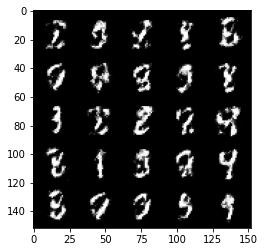

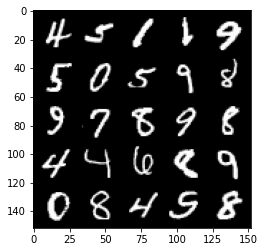

Epoch 82, step 38500: Generator loss: 2.269734379529953, discriminator loss: 0.26665452370047554


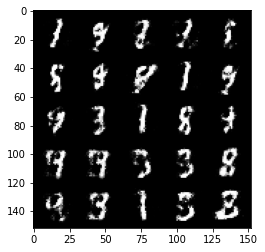

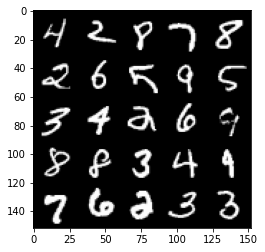

Epoch 83, step 39000: Generator loss: 2.139325433254243, discriminator loss: 0.2924260840117931


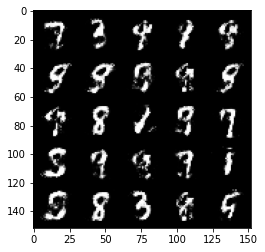

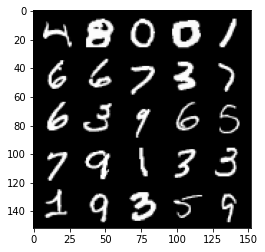

Epoch 84, step 39500: Generator loss: 2.1465080540180184, discriminator loss: 0.28274546959996205


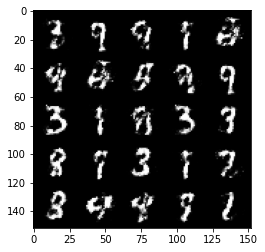

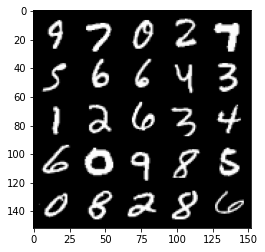

Epoch 85, step 40000: Generator loss: 2.074796037197114, discriminator loss: 0.2945335441529755


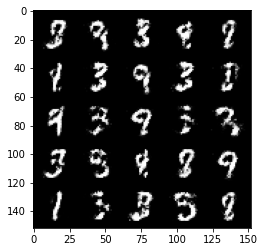

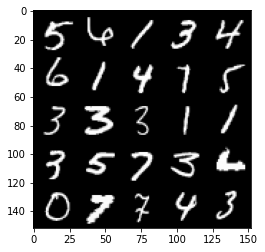

Epoch 86, step 40500: Generator loss: 2.0119380567073812, discriminator loss: 0.3066947939693928


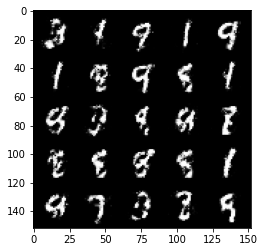

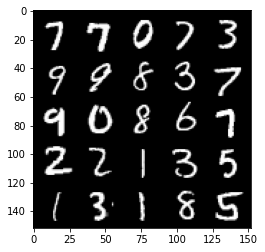

Epoch 87, step 41000: Generator loss: 1.9236085066795348, discriminator loss: 0.3412067609429359


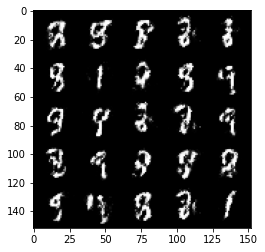

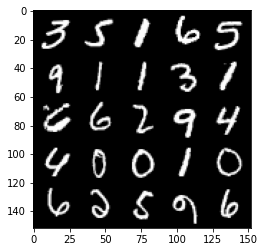

Epoch 88, step 41500: Generator loss: 1.8785543153285997, discriminator loss: 0.33873322063684463


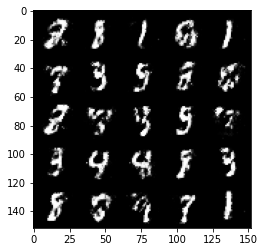

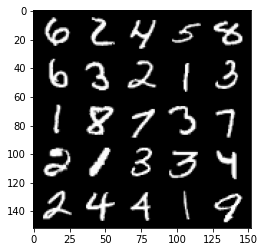

Epoch 89, step 42000: Generator loss: 1.888055584192277, discriminator loss: 0.33236796173453337


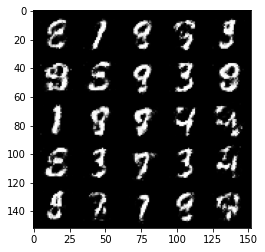

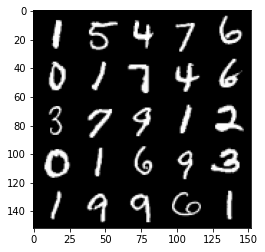

Epoch 90, step 42500: Generator loss: 1.938249656915666, discriminator loss: 0.3235885198414325


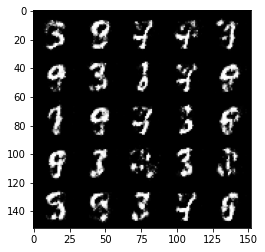

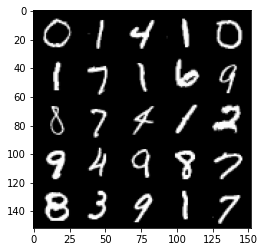

Epoch 91, step 43000: Generator loss: 1.9063487386703484, discriminator loss: 0.3329940540790555


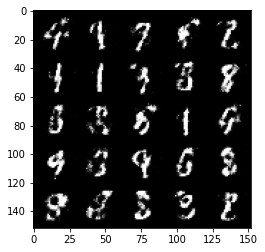

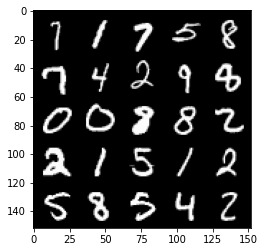

Epoch 92, step 43500: Generator loss: 1.902165990114214, discriminator loss: 0.32448650890588804


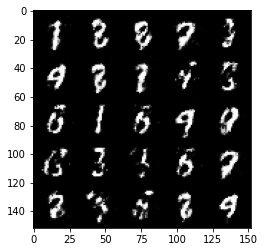

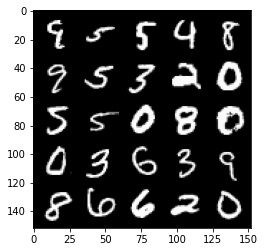

Epoch 93, step 44000: Generator loss: 1.9060592191219348, discriminator loss: 0.3210992139279843


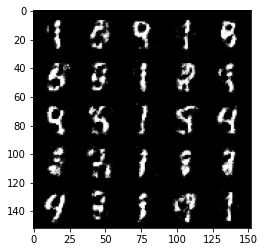

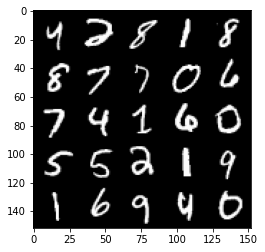

Epoch 94, step 44500: Generator loss: 1.9724052186012258, discriminator loss: 0.31368835294246644


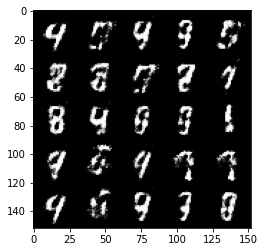

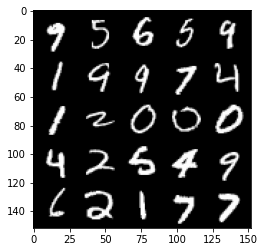

Epoch 95, step 45000: Generator loss: 1.783108783006667, discriminator loss: 0.3647295486032964


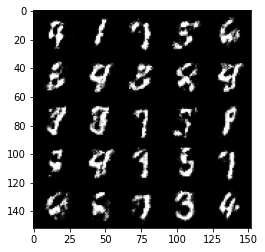

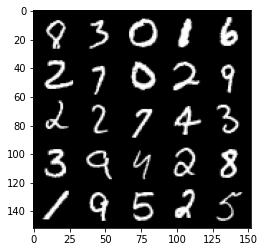

Epoch 97, step 45500: Generator loss: 1.9376423225402841, discriminator loss: 0.3165987621247766


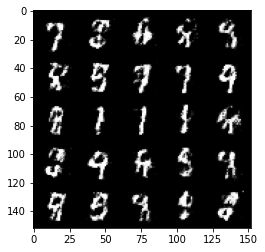

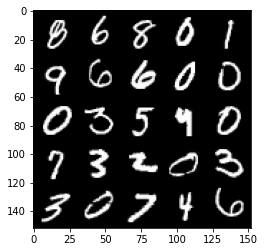

Epoch 98, step 46000: Generator loss: 1.8357838742733, discriminator loss: 0.33527683058381075


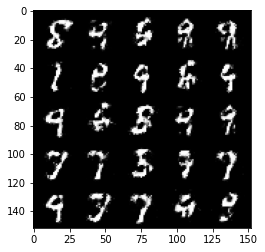

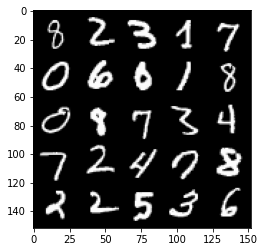

Epoch 99, step 46500: Generator loss: 1.8101621041297917, discriminator loss: 0.3598833512067795


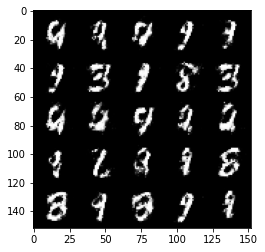

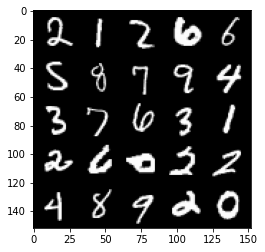

Epoch 100, step 47000: Generator loss: 1.8513736155033094, discriminator loss: 0.3298688813447953


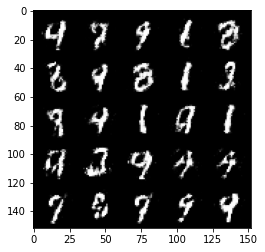

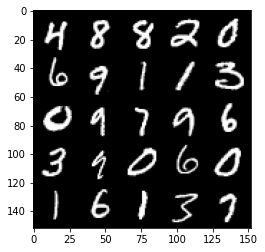

Epoch 101, step 47500: Generator loss: 1.7899367709159844, discriminator loss: 0.34968492218852093


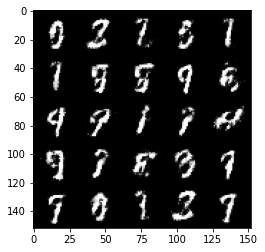

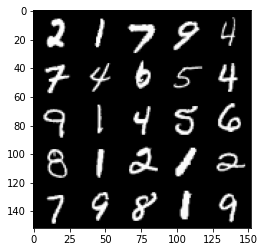

Epoch 102, step 48000: Generator loss: 1.6895631351470946, discriminator loss: 0.3636709734201425


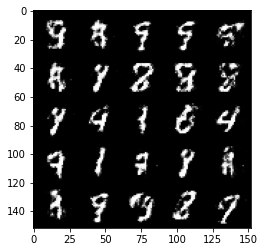

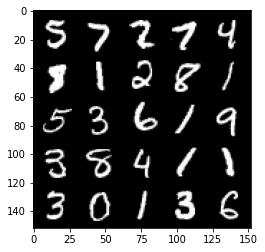

Epoch 103, step 48500: Generator loss: 1.770304753780364, discriminator loss: 0.35169408389925993


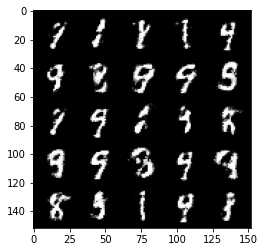

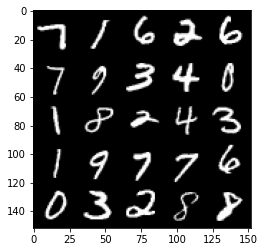

Epoch 104, step 49000: Generator loss: 1.7236773982048037, discriminator loss: 0.3644354471564295


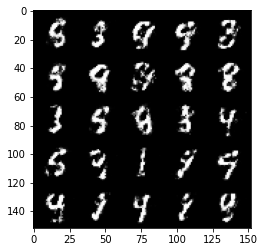

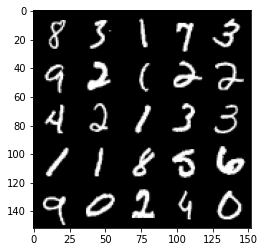

Epoch 105, step 49500: Generator loss: 1.680073437929153, discriminator loss: 0.37217020577192317


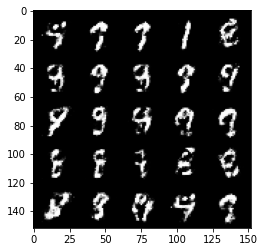

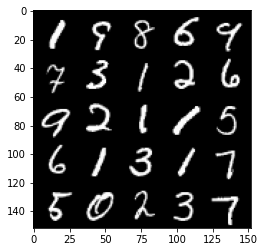

Epoch 106, step 50000: Generator loss: 1.7043790919780737, discriminator loss: 0.37153157299757006


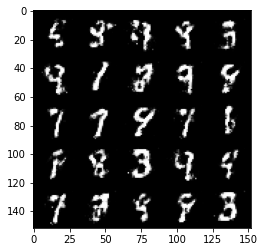

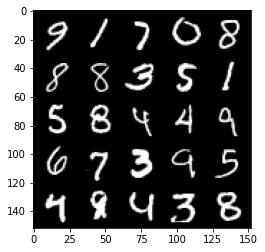

Epoch 107, step 50500: Generator loss: 1.7301128313541414, discriminator loss: 0.3528987641334533


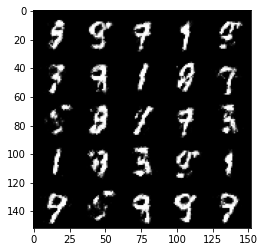

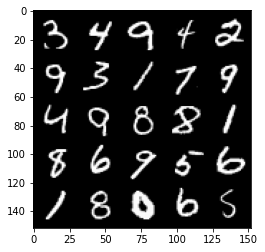

Epoch 108, step 51000: Generator loss: 1.6559834280014036, discriminator loss: 0.3764689800143244


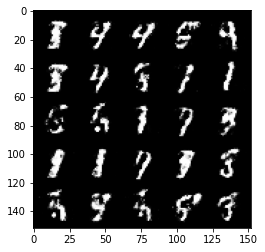

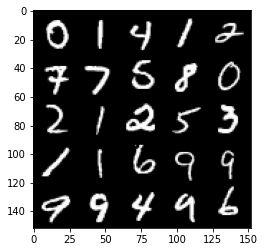

Epoch 109, step 51500: Generator loss: 1.5621550321578983, discriminator loss: 0.39879650646448145


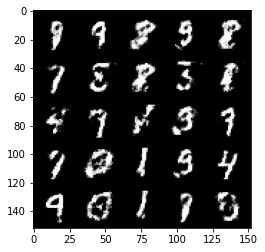

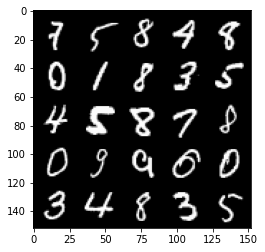

Epoch 110, step 52000: Generator loss: 1.6306518988609313, discriminator loss: 0.38177479863166813


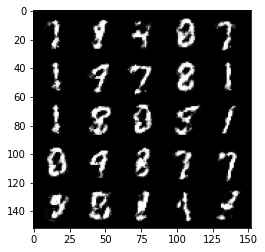

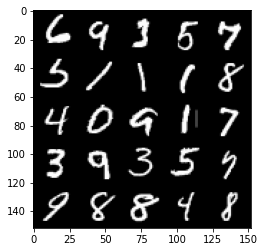

Epoch 111, step 52500: Generator loss: 1.5464875392913822, discriminator loss: 0.4056939184069634


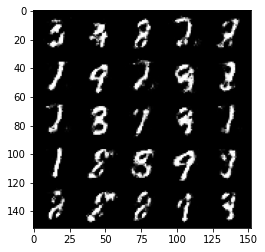

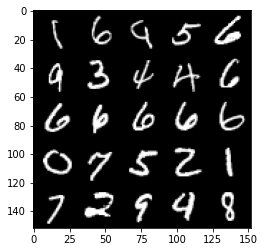

Epoch 113, step 53000: Generator loss: 1.5702047910690313, discriminator loss: 0.3912829658389089


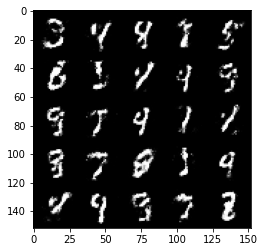

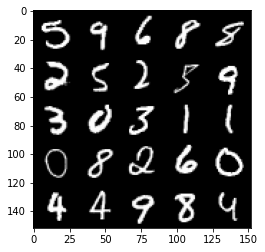

Epoch 114, step 53500: Generator loss: 1.5620346584320062, discriminator loss: 0.3975853875279428


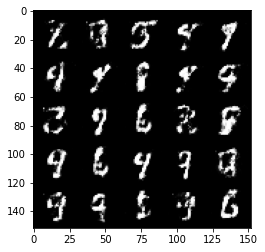

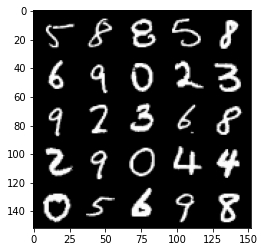

Epoch 115, step 54000: Generator loss: 1.6079292066097266, discriminator loss: 0.39748173153400457


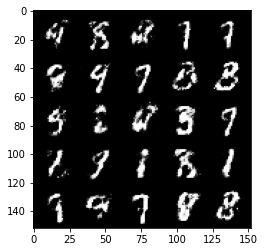

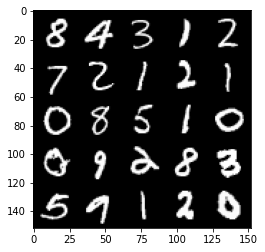

Epoch 116, step 54500: Generator loss: 1.5479029376506803, discriminator loss: 0.4073851239085197


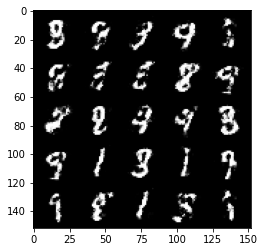

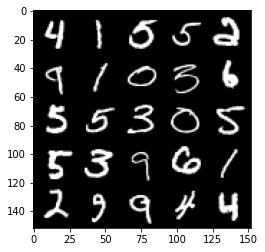

Epoch 117, step 55000: Generator loss: 1.4946704204082482, discriminator loss: 0.4150267972946167


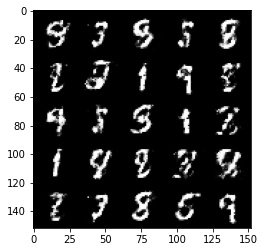

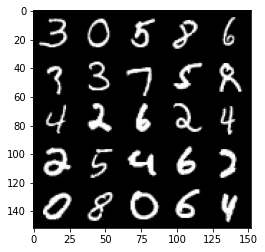

Epoch 118, step 55500: Generator loss: 1.6264475035667405, discriminator loss: 0.37500934511423123


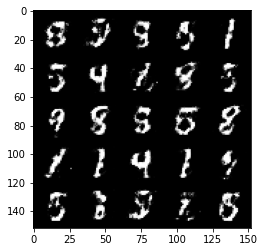

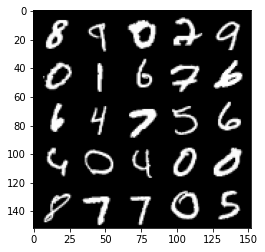

Epoch 119, step 56000: Generator loss: 1.639895639657976, discriminator loss: 0.3838340775966641


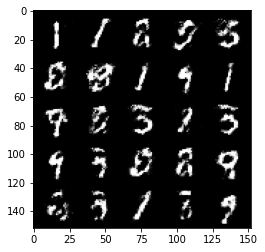

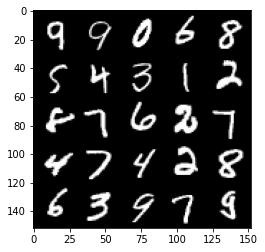

Epoch 120, step 56500: Generator loss: 1.505628218889236, discriminator loss: 0.4081661801934242


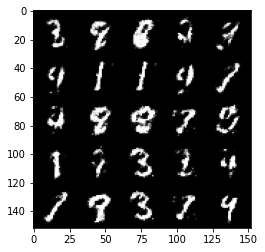

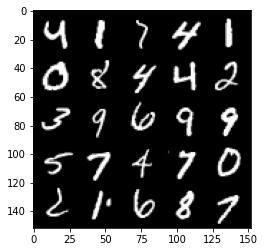

Epoch 121, step 57000: Generator loss: 1.5378763773441313, discriminator loss: 0.3982858250141143


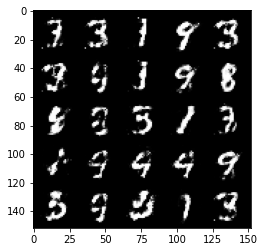

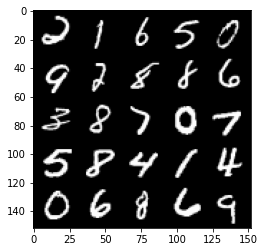

Epoch 122, step 57500: Generator loss: 1.510584620952607, discriminator loss: 0.405746786415577


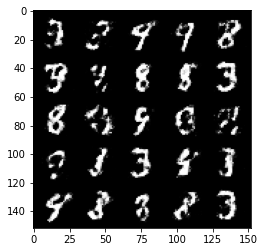

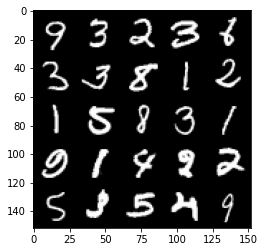

Epoch 123, step 58000: Generator loss: 1.5016454358100908, discriminator loss: 0.40806834679842


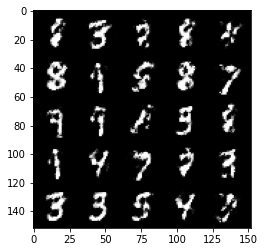

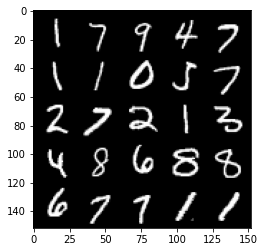

Epoch 124, step 58500: Generator loss: 1.6116439619064342, discriminator loss: 0.36702892124652853


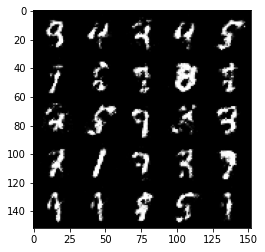

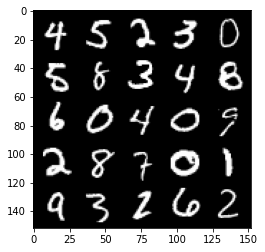

Epoch 125, step 59000: Generator loss: 1.512625508785249, discriminator loss: 0.4054644470810896


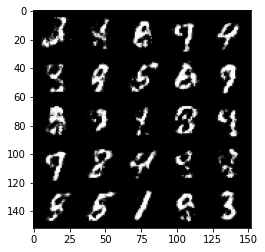

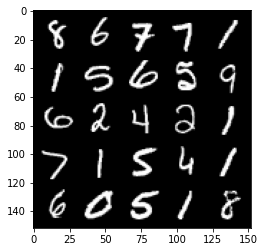

Epoch 126, step 59500: Generator loss: 1.4967853155136113, discriminator loss: 0.4117220069169997


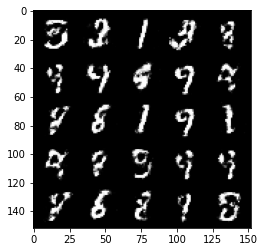

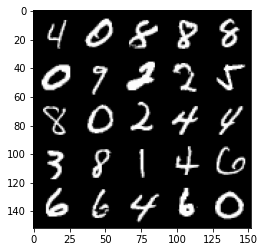

Epoch 127, step 60000: Generator loss: 1.4268214468955995, discriminator loss: 0.4290785236358643


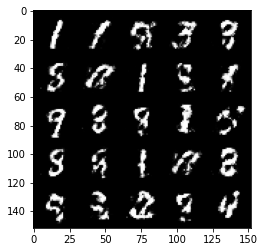

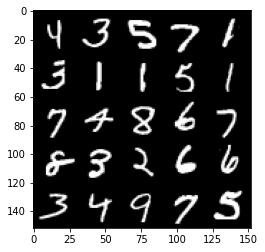

Epoch 128, step 60500: Generator loss: 1.4258532857894899, discriminator loss: 0.431897846281528


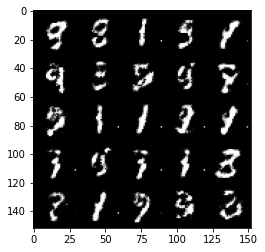

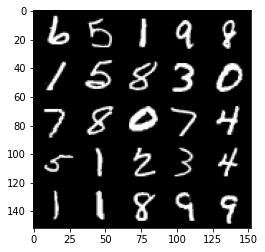

Epoch 130, step 61000: Generator loss: 1.549389714956283, discriminator loss: 0.38991888755559856


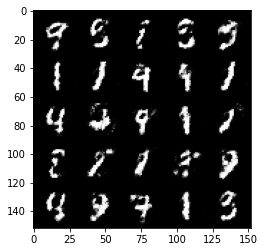

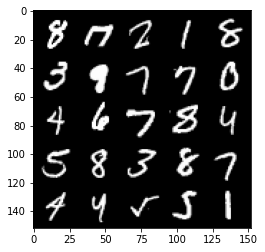

Epoch 131, step 61500: Generator loss: 1.4882465653419479, discriminator loss: 0.41624452251195854


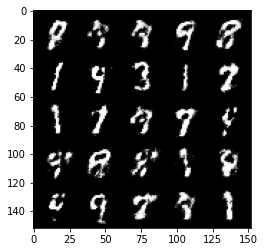

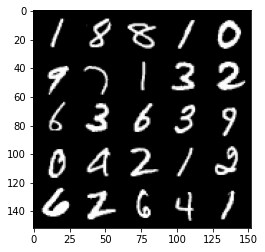

Epoch 132, step 62000: Generator loss: 1.4472759287357317, discriminator loss: 0.4165504354834557


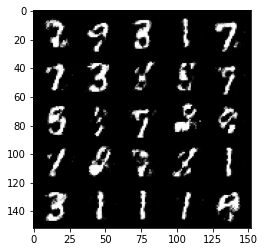

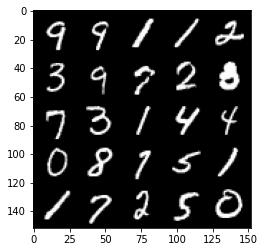

Epoch 133, step 62500: Generator loss: 1.5120914463996884, discriminator loss: 0.3940105994939805


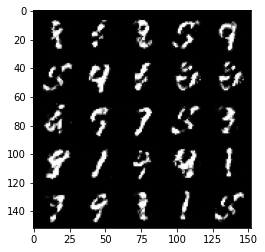

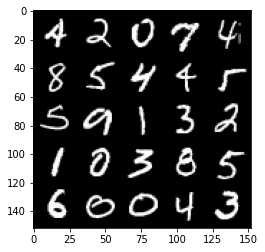

Epoch 134, step 63000: Generator loss: 1.4017702207565301, discriminator loss: 0.44050363337993625


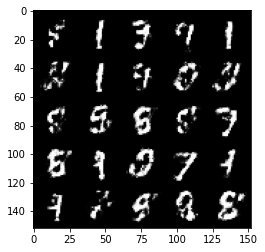

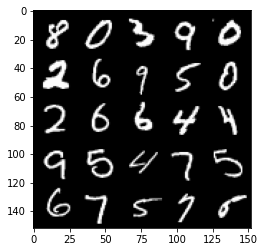

Epoch 135, step 63500: Generator loss: 1.4692303895950314, discriminator loss: 0.4183423933386803


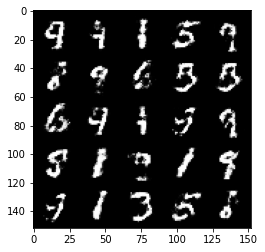

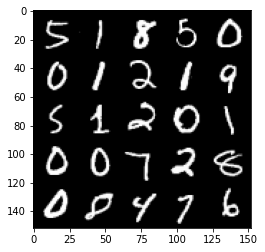

Epoch 136, step 64000: Generator loss: 1.4259846959114078, discriminator loss: 0.43080948591232315


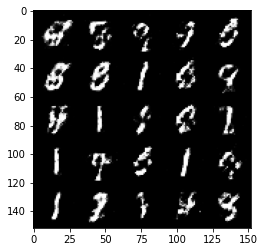

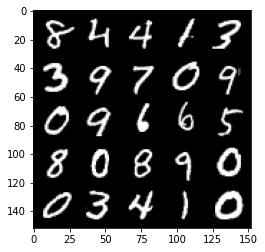

Epoch 137, step 64500: Generator loss: 1.46761063671112, discriminator loss: 0.4233823234438897


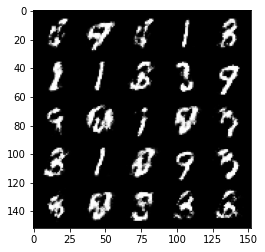

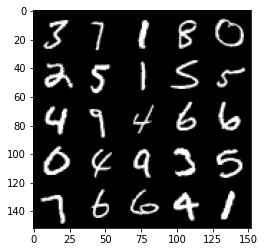

Epoch 138, step 65000: Generator loss: 1.4222743651866905, discriminator loss: 0.4298855861425396


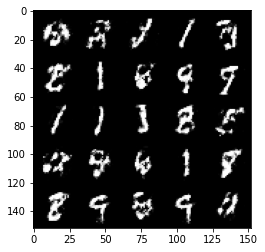

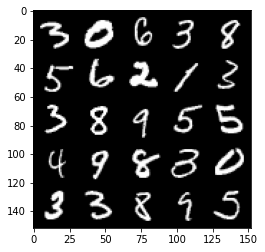

Epoch 139, step 65500: Generator loss: 1.4345546741485593, discriminator loss: 0.4311398746371265


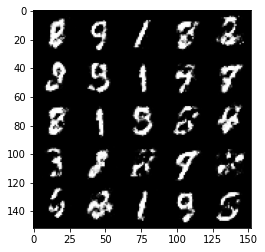

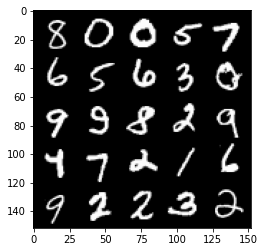

Epoch 140, step 66000: Generator loss: 1.3494113602638254, discriminator loss: 0.4582974093556406


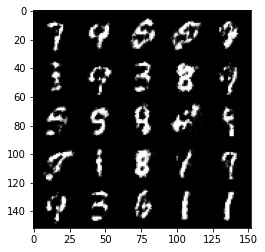

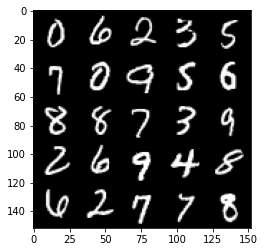

Epoch 141, step 66500: Generator loss: 1.3336324844360352, discriminator loss: 0.4535460912585257


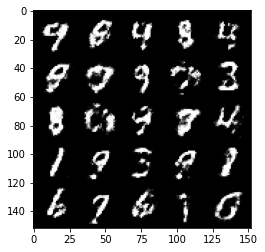

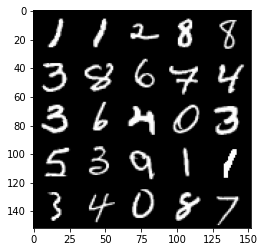

Epoch 142, step 67000: Generator loss: 1.3301846518516536, discriminator loss: 0.4650627843141564


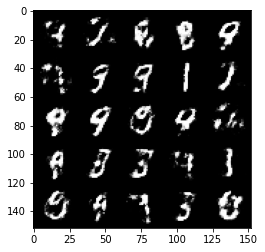

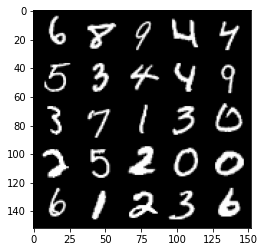

Epoch 143, step 67500: Generator loss: 1.3369089636802682, discriminator loss: 0.43841528201103214


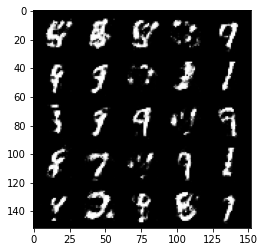

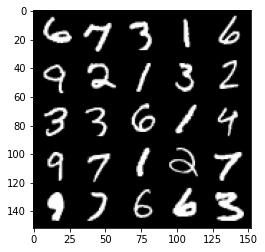

Epoch 144, step 68000: Generator loss: 1.3824344737529761, discriminator loss: 0.4440392219424245


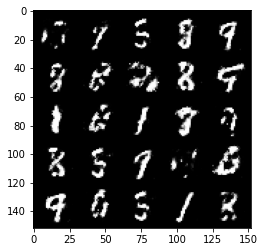

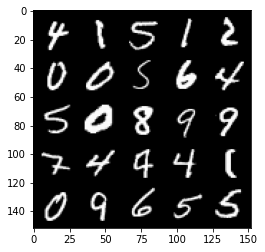

Epoch 146, step 68500: Generator loss: 1.2838960790634162, discriminator loss: 0.4594479238986966


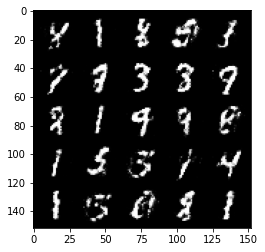

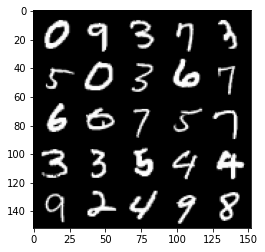

Epoch 147, step 69000: Generator loss: 1.3338284375667562, discriminator loss: 0.4515288584232335


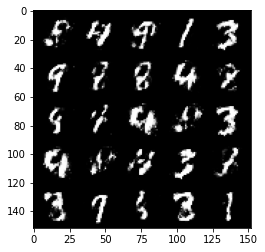

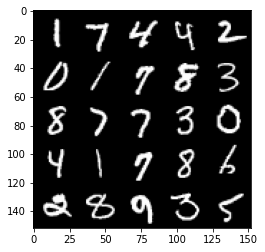

Epoch 148, step 69500: Generator loss: 1.3962470192909242, discriminator loss: 0.4328615432977677


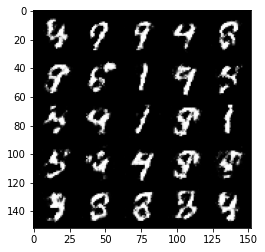

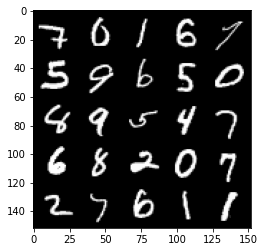

Epoch 149, step 70000: Generator loss: 1.3317978305816631, discriminator loss: 0.4748430337905885


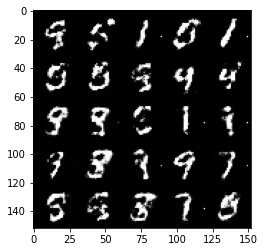

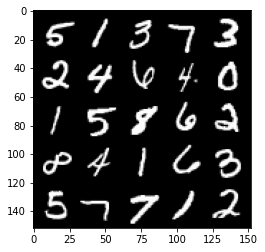

Epoch 150, step 70500: Generator loss: 1.3407466850280756, discriminator loss: 0.4484727444648742


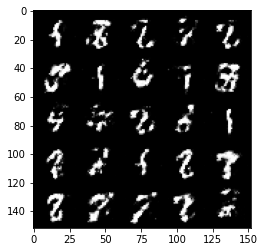

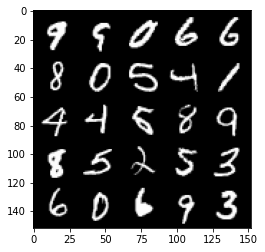

Epoch 151, step 71000: Generator loss: 1.3521454167366038, discriminator loss: 0.4380885449647903


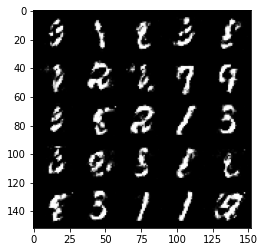

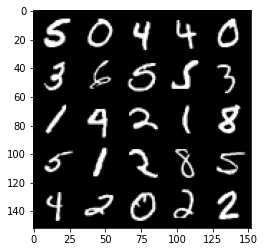

Epoch 152, step 71500: Generator loss: 1.4090363206863397, discriminator loss: 0.4324250103235249


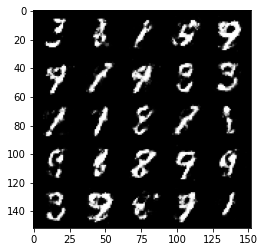

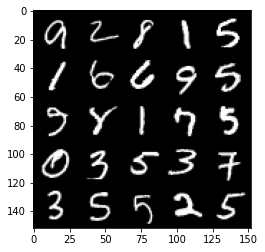

Epoch 153, step 72000: Generator loss: 1.2844457786083223, discriminator loss: 0.47469638526439667


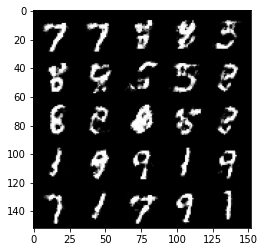

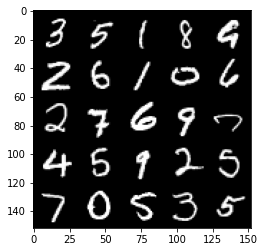

Epoch 154, step 72500: Generator loss: 1.2573215620517733, discriminator loss: 0.47159605073928806


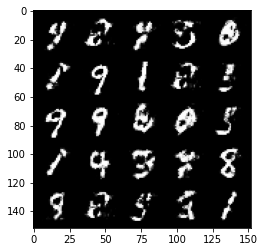

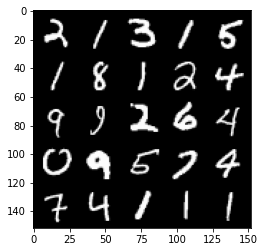

Epoch 155, step 73000: Generator loss: 1.2153366086482997, discriminator loss: 0.48681735366582873


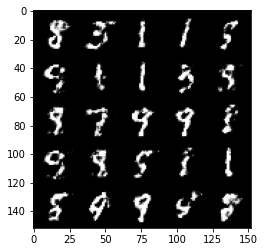

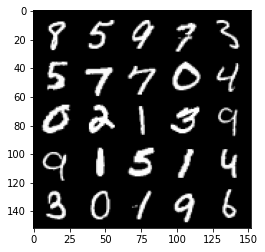

Epoch 156, step 73500: Generator loss: 1.259183561801911, discriminator loss: 0.46420778399705903


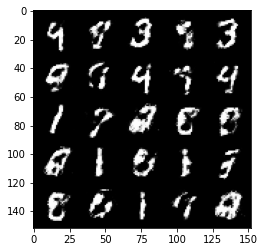

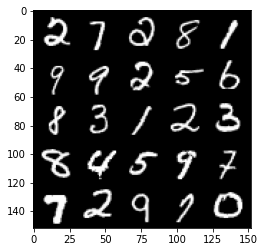

Epoch 157, step 74000: Generator loss: 1.2139919930696492, discriminator loss: 0.4925245408415794


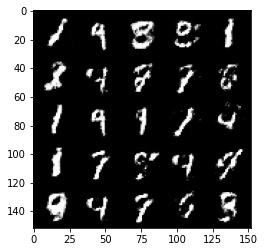

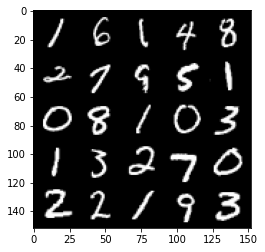

Epoch 158, step 74500: Generator loss: 1.1951223819255827, discriminator loss: 0.5068652515411375


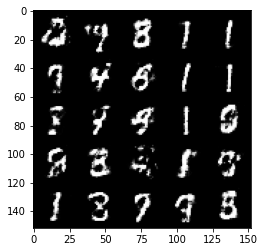

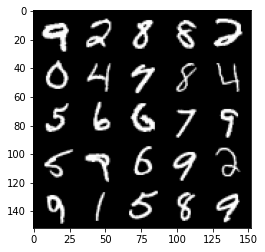

Epoch 159, step 75000: Generator loss: 1.149379901170731, discriminator loss: 0.5109497385025021


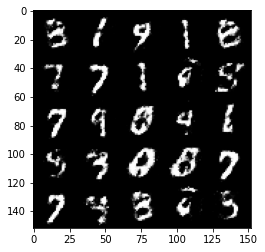

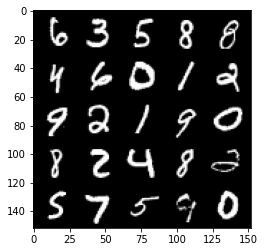

Epoch 160, step 75500: Generator loss: 1.1831735951900475, discriminator loss: 0.4942516663074492


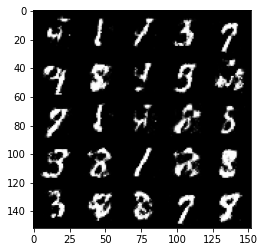

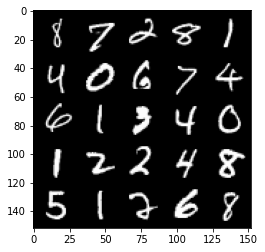

Epoch 162, step 76000: Generator loss: 1.2063088235855115, discriminator loss: 0.4825908204317092


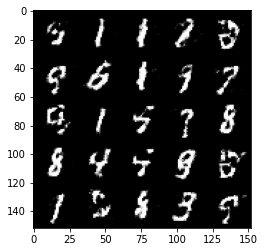

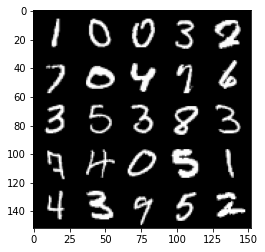

Epoch 163, step 76500: Generator loss: 1.2360934293270114, discriminator loss: 0.48859728056192375


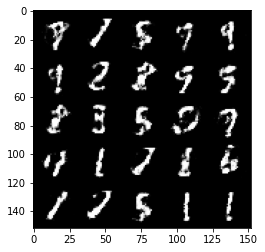

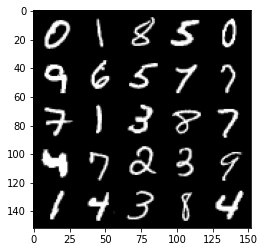

Epoch 164, step 77000: Generator loss: 1.2518291740417478, discriminator loss: 0.4662396629452706


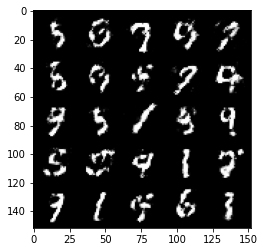

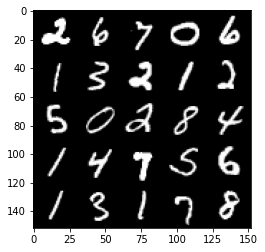

Epoch 165, step 77500: Generator loss: 1.2545022387504576, discriminator loss: 0.47857935869693785


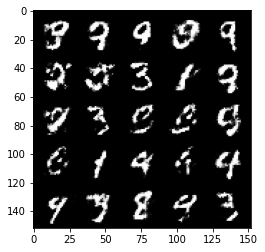

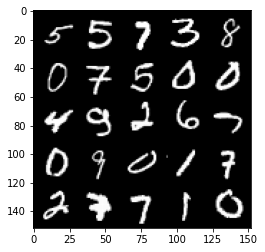

Epoch 166, step 78000: Generator loss: 1.214979063272477, discriminator loss: 0.48870137888193116


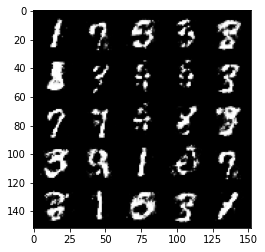

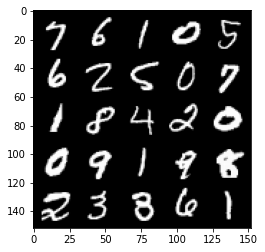

Epoch 167, step 78500: Generator loss: 1.1807594170570366, discriminator loss: 0.4874318276643752


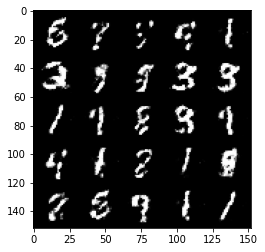

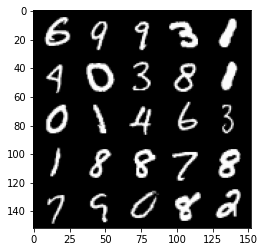

Epoch 168, step 79000: Generator loss: 1.2291797025203697, discriminator loss: 0.46498853605985624


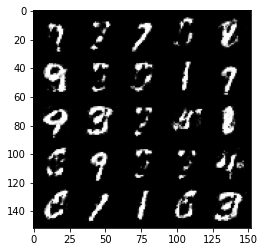

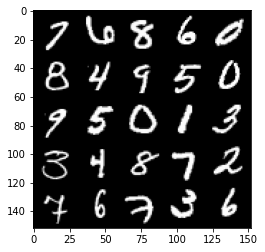

Epoch 169, step 79500: Generator loss: 1.2091314058303841, discriminator loss: 0.482783353924751


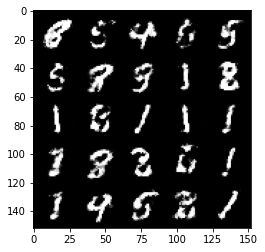

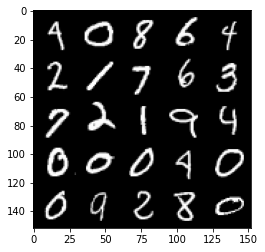

Epoch 170, step 80000: Generator loss: 1.2139391646385198, discriminator loss: 0.4806817833185196


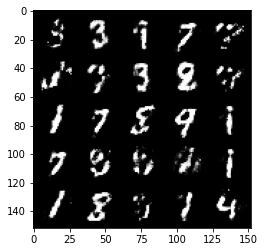

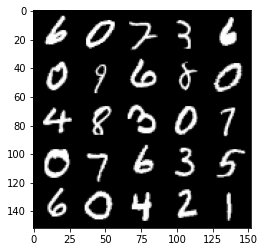

Epoch 171, step 80500: Generator loss: 1.2170625238418578, discriminator loss: 0.4752071286439896


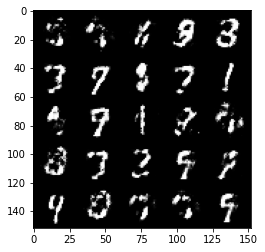

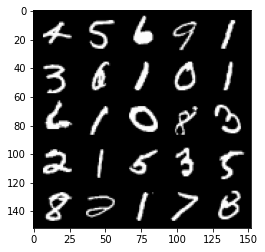

Epoch 172, step 81000: Generator loss: 1.3464102246761327, discriminator loss: 0.4363138003945354


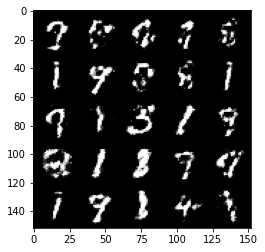

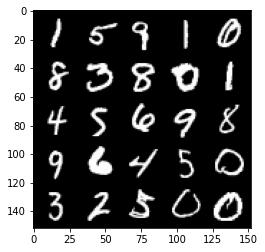

Epoch 173, step 81500: Generator loss: 1.2494304046630862, discriminator loss: 0.4833803573846819


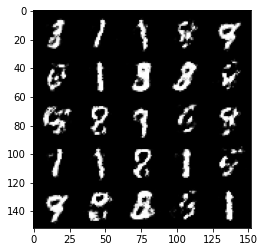

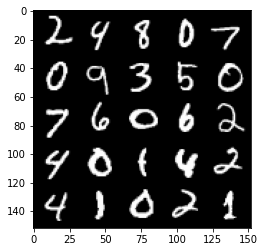

Epoch 174, step 82000: Generator loss: 1.2860933930873872, discriminator loss: 0.45863559508323654


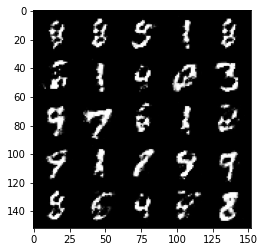

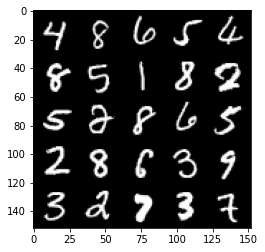

Epoch 175, step 82500: Generator loss: 1.2873667156696313, discriminator loss: 0.4565317752957349


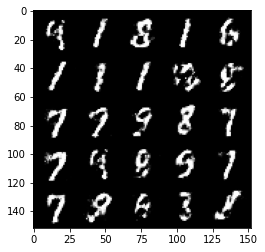

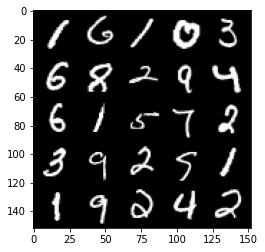

Epoch 176, step 83000: Generator loss: 1.1922910975217835, discriminator loss: 0.5104872229099269


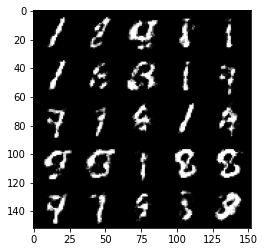

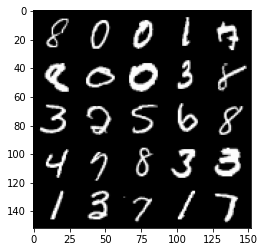

Epoch 178, step 83500: Generator loss: 1.1307624518871298, discriminator loss: 0.5011834232807161


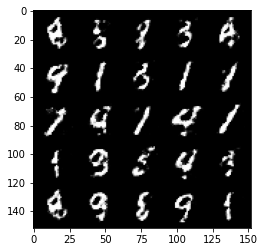

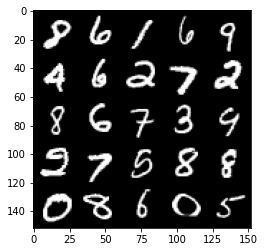

Epoch 179, step 84000: Generator loss: 1.1889603009223946, discriminator loss: 0.492887147843838


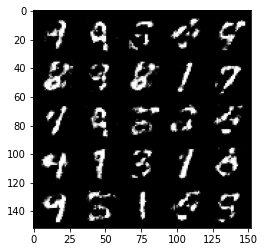

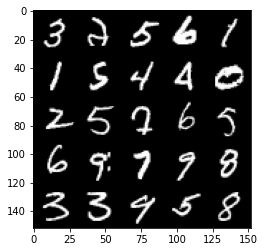

Epoch 180, step 84500: Generator loss: 1.1109780902862545, discriminator loss: 0.5273425307273861


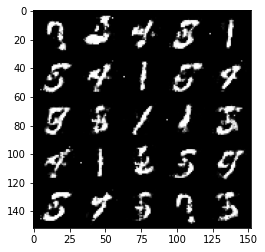

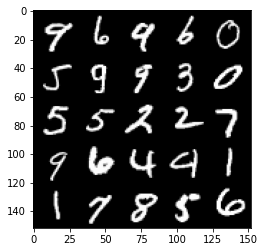

Epoch 181, step 85000: Generator loss: 1.1692047381401072, discriminator loss: 0.4985649039149285


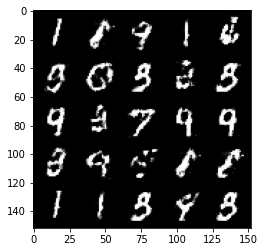

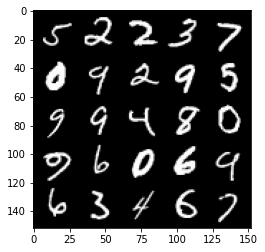

Epoch 182, step 85500: Generator loss: 1.1533997900485988, discriminator loss: 0.5038013566732404


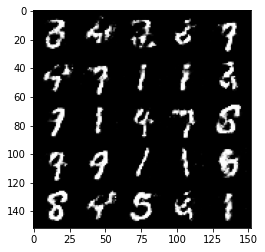

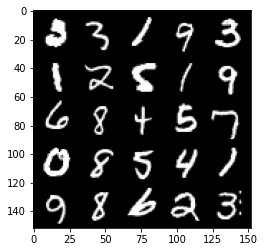

Epoch 183, step 86000: Generator loss: 1.1327064409255985, discriminator loss: 0.5012363530397412


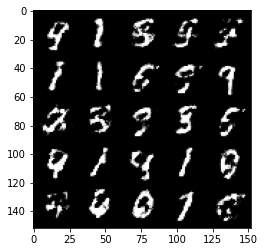

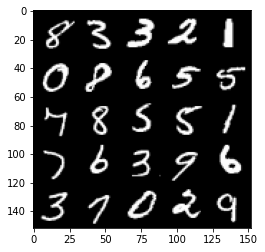

Epoch 184, step 86500: Generator loss: 1.2194289271831504, discriminator loss: 0.4884876944422728


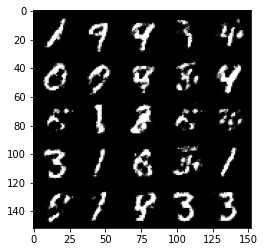

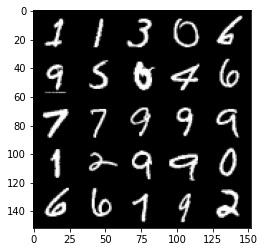

Epoch 185, step 87000: Generator loss: 1.1346713776588444, discriminator loss: 0.5022805448174474


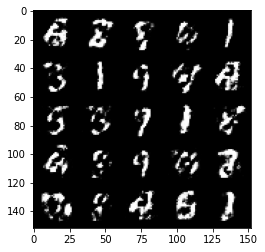

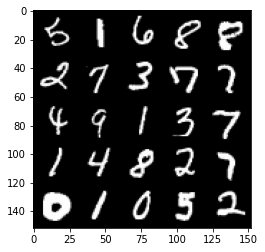

Epoch 186, step 87500: Generator loss: 1.1140544701814648, discriminator loss: 0.5147832955121989


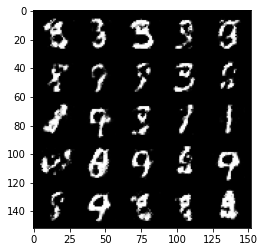

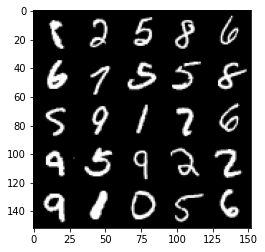

Epoch 187, step 88000: Generator loss: 1.1101230367422101, discriminator loss: 0.5062197189927103


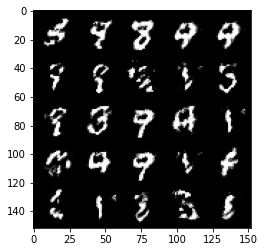

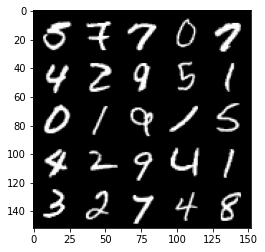

Epoch 188, step 88500: Generator loss: 1.0964831161499036, discriminator loss: 0.5044042268395424


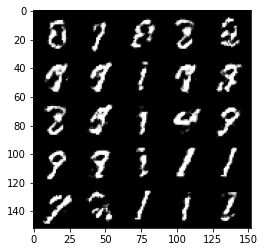

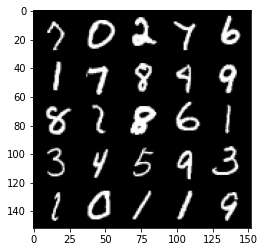

Epoch 189, step 89000: Generator loss: 1.1452644802331924, discriminator loss: 0.5055091156959535


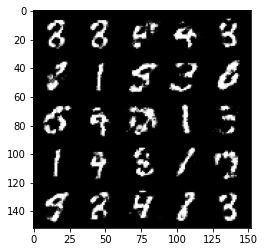

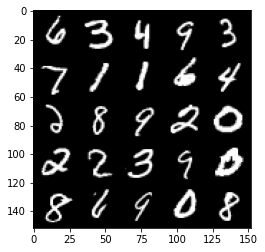

Epoch 190, step 89500: Generator loss: 1.1407612360715864, discriminator loss: 0.5145656331181528


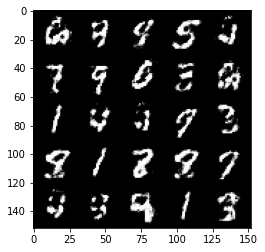

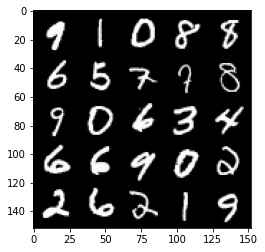

Epoch 191, step 90000: Generator loss: 1.0769325456619252, discriminator loss: 0.5378991200327872


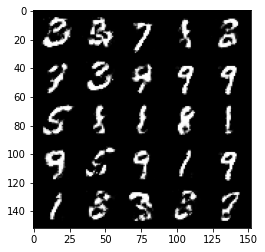

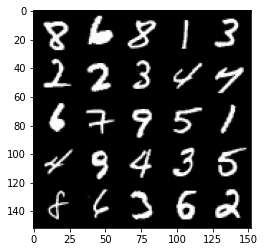

Epoch 192, step 90500: Generator loss: 1.0462549381256103, discriminator loss: 0.5358930096626282


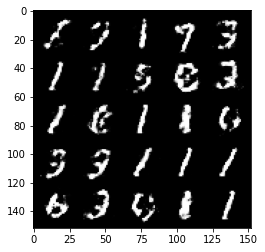

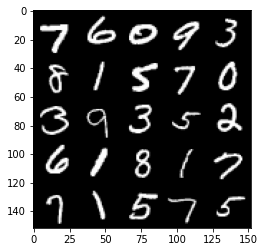

Epoch 194, step 91000: Generator loss: 1.134629736304284, discriminator loss: 0.5099234268665317


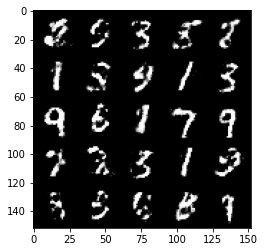

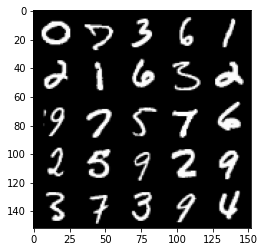

Epoch 195, step 91500: Generator loss: 1.0583830941915517, discriminator loss: 0.544122099816799


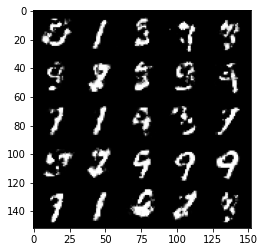

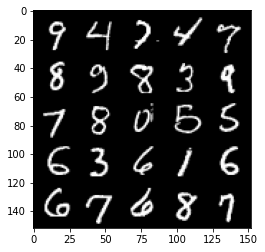

Epoch 196, step 92000: Generator loss: 1.1251116392612455, discriminator loss: 0.5072564219236372


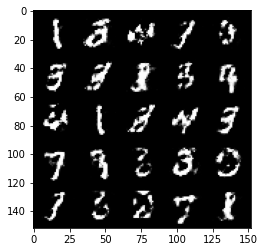

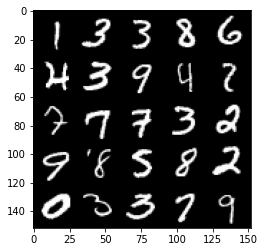

Epoch 197, step 92500: Generator loss: 1.080314629435539, discriminator loss: 0.5133090189695358


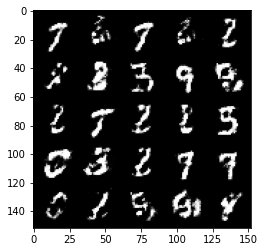

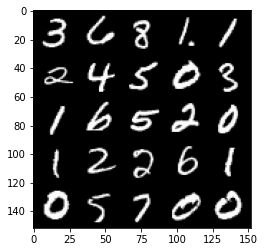

Epoch 198, step 93000: Generator loss: 1.2033495769500737, discriminator loss: 0.4730179237723348


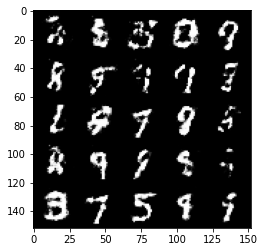

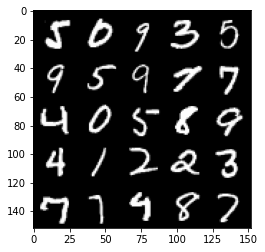

Epoch 199, step 93500: Generator loss: 1.1907195432186113, discriminator loss: 0.48205144459009186


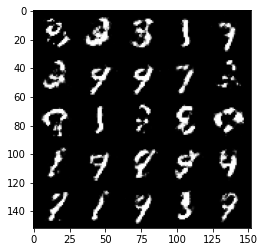

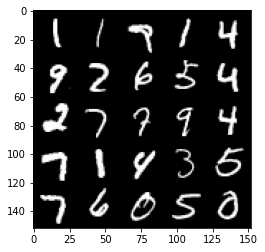

In [20]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        
        gen_loss.backward(retain_graph=True)
        
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
